In [1]:
import pandas as pd #Pandas kita gunakan untuk membaca dataset yang bentuknya dalam format “csv”

In [2]:
#memanggil dataset
data1 = pd.read_csv('pilpres_1.csv')
data2 = pd.read_csv('capres.csv')
data3 = pd.read_csv('calonpresiden_1.csv')

In [3]:
frames =[data1, data2,data3] #memuat dataframe 
df = pd.concat(frames).drop_duplicates().reset_index(drop=True) #menggabungkan dataframe tanpa duplikat dan mengatur ulang index
df.to_csv(r'dup.csv', index=False) #menyimpan hasil gabungan 
df #menampilkan dataframe yang dihasilkan

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1619096014513901570,1619096014513901570,2023-01-28 05:12:25 SE Asia Standard Time,2023-01-28,05:12:25,700,1029399339297202176,novelbamukmin,Novel Bamukmin,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1619093974169571329,1619093974169571329,2023-01-28 05:04:19 SE Asia Standard Time,2023-01-28,05:04:19,700,1537734191215181824,kinantiayank,kinanti,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2,1619093925494665218,1619093925494665218,2023-01-28 05:04:07 SE Asia Standard Time,2023-01-28,05:04:07,700,1537734191215181824,kinantiayank,kinanti,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,1619093853230993410,1619093853230993410,2023-01-28 05:03:50 SE Asia Standard Time,2023-01-28,05:03:50,700,1537734191215181824,kinantiayank,kinanti,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1619092794425098249,1618952661541490690,2023-01-28 04:59:38 SE Asia Standard Time,2023-01-28,04:59:38,700,1464971698080415749,faixsakti,Faix Sakti,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'ekowboy2', 'name': '🄴🄺🄾 🅆🄸🄳🄾...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3708,1620062757428273152,1620062757428273152,2023-01-30 21:13:55 SE Asia Standard Time,2023-01-30,21:13:55,700,80559922,ferizandra,ferizandra,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3709,1620061789420670976,1620061789420670976,2023-01-30 21:10:04 SE Asia Standard Time,2023-01-30,21:10:04,700,68930552,mediaindonesia,Media Indonesia,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3710,1620052912914464768,1620052912914464768,2023-01-30 20:34:48 SE Asia Standard Time,2023-01-30,20:34:48,700,1576003385907871744,anies_relawan,Relawan ANIES_Official,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3711,1620041393904427017,1620041393904427017,2023-01-30 19:49:01 SE Asia Standard Time,2023-01-30,19:49:01,700,83867535,tifsembiring,Tifatul Sembiring,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [4]:
hasil =[]
for i in range(len(df['username'])):
    if((df['mentions'][i])!='[]'):
        for x in eval(df['mentions'][i]):
            hasil.append([df['username'][i],x['screen_name'],'mention'])
    if((df['reply_to'][i])!='[]'):
        for x in eval(df['reply_to'][i]):
            hasil.append([df['username'][i],x['screen_name'],'reply'])
            
tes = pd.DataFrame(hasil,columns=['username','target','type'])
tes.to_csv("hubungan.csv")
tes

,username,target,type
0,faixsakti,ekowboy2,reply
1,simanjunta9nico,jarnasabwbpn,mention
2,simanjunta9nico,aniesahy,mention
3,simanjunta9nico,jarnasabw,mention
4,simanjunta9nico,langkahanies,mention
...,...,...,...
1596,ha54nazib,demokrat,mention
1597,anies_relawan,nasdem,mention
1598,anies_relawan,pdemokrat,mention
1599,anies_relawan,pksejahtera,mention


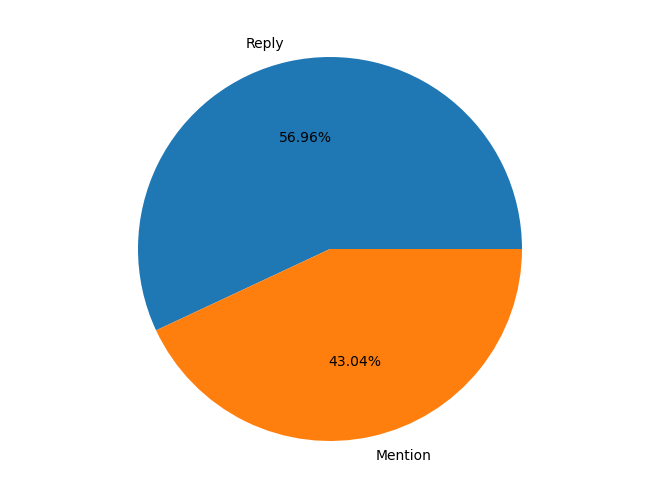

In [5]:
import matplotlib.pyplot as plt
reply = []
mention =[]
for i in tes['type']:
    if(i=='reply'):
        mention.append('1')
    else:
        reply.append('1')
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.axis('equal')
edge = ['Reply', 'Mention']
nilai = [len(reply), len(mention)]
ax.pie(nilai, labels=edge, autopct='%1.2f%%')
plt.savefig("presentase.png")
plt.show()

In [6]:
#visualisasi degree centrality
import numpy as np #untuk proses komputasi numerik
import matplotlib.pyplot as plt #membuat beberapa perubahan pada gambar, membuat area plot dalam gambar, menambah label di plot dan lainnya
import matplotlib.cm as cm #mengakses peta warna bawaan matplotlib
import matplotlib.colors as mcolors # urutan warna yang digunakan sebagai warna pengisi untuk setiap level
import networkx as nx #merepresentasikan jaringan dalam bentuk grafik dengan node dan edge
#digunakan agar hasil visualisasi bisa langsung tercetak di Jupyter Notebook
%matplotlib inline 
Graph_type = nx.Graph()
G = nx.from_pandas_edgelist(tes, source = 'username', target ='target') #isi grafik dengan kolom 'username' dan 'target' dari tes kerangka data.

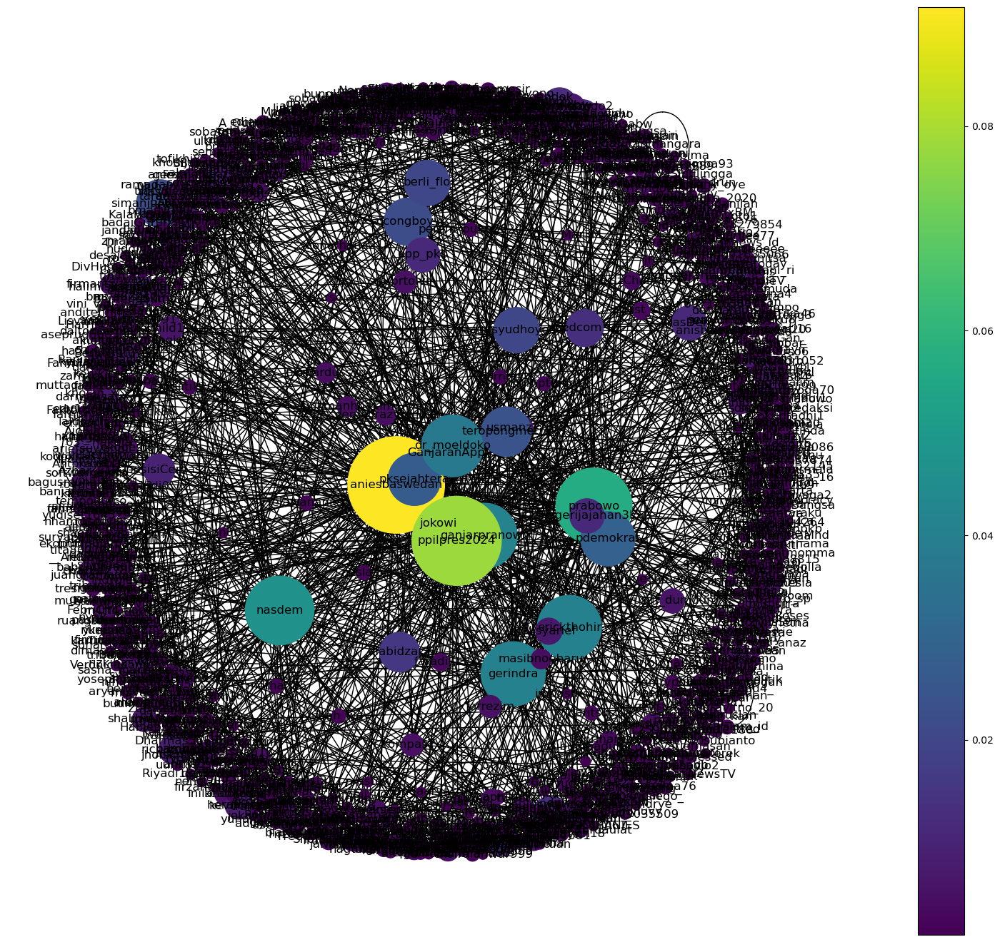

In [8]:
plt.figure(figsize=(15,13)) #mengatur ukuran gambar

deg_centrality = nx.degree_centrality(G)
cent = np.fromiter(deg_centrality.values(), float)
sizes = cent / np.max(cent) * 200
normalize = mcolors.Normalize(vmin=cent.min(), vmax=cent.max()) #atur normalisasi dan peta warna
colormap = cm.viridis #Palet Viridis diimplementasikan menggunakan urutan warna biru dan kuning (dan menghindari warna merah), untuk meningkatkan keterbacaan visualisasi

#atur bilah warna
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(cent)

pos = nx.spring_layout(G,k=1, scale=3) # k mengontrol jarak antara node dan bervariasi antara 0 dan 1, scale mengatur jarak antar semua node
nx.draw(G, pos, node_color=cent,
       node_size=[v * 100 for v in dict(nx.degree(G)).values()])
nx.draw_networkx_labels(G, pos)
plt.colorbar(scalarmappaple)
plt.savefig("degree.png")
plt.show()

In [7]:
nx.degree(G)
lst = nx.degree(G)
dc = pd.DataFrame(lst, columns=['username', 'Nilai'])
dc.nlargest(10, 'Nilai')#mengembalikan sejumlah baris tertentu, mulai dari atas setelah mengurutkan DataFrame dengan nilai tertinggi untuk kolom tertentu.

,username,Nilai
29,aniesbaswedan,95
609,ppilpres2024,81
90,prabowo,59
28,nasdem,48
51,ganjarpranowo,43
26,erickthohir,42
91,gerindra,42
334,dr_moeldoko,39
98,pdemokrat,30
130,pksejahtera,28


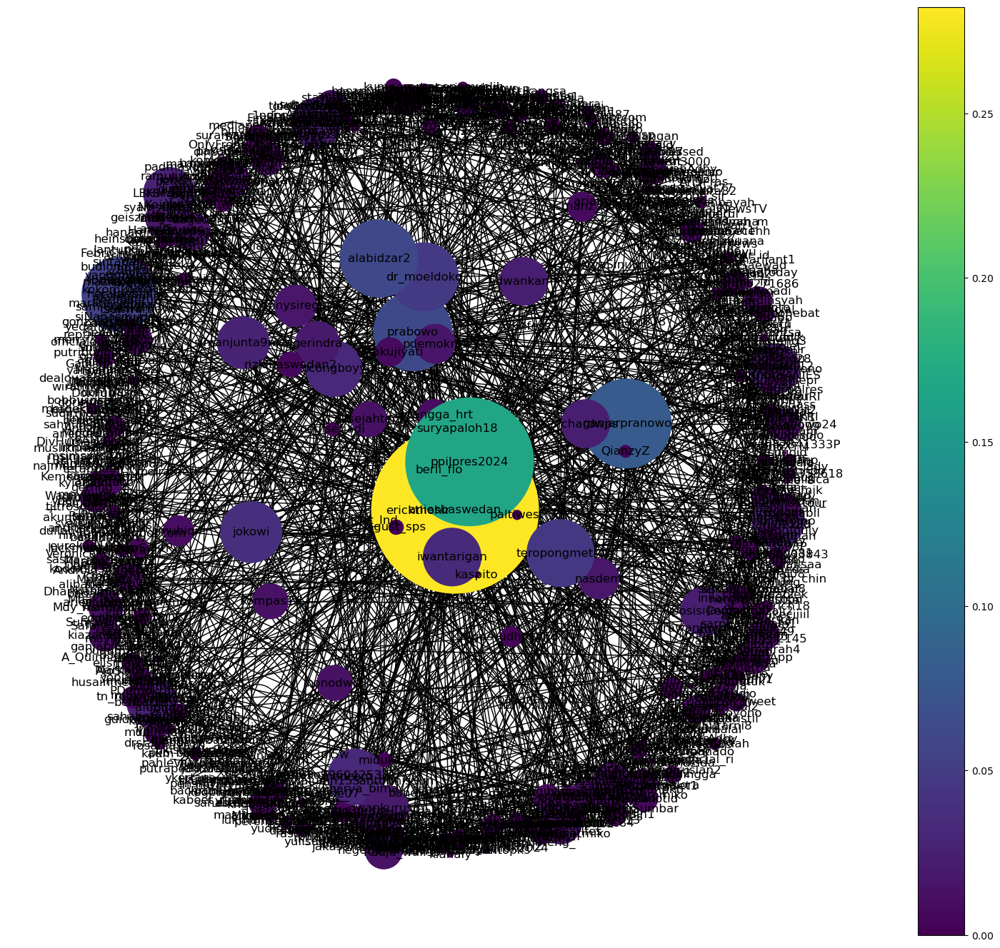

In [8]:
plt.figure(figsize=(15,13)) #mengatur ukuran gambar

bet_centrality = nx.betweenness_centrality(G)
cent = np.fromiter(bet_centrality.values(), float)
sizes = cent / np.max(cent) * 200
normalize = mcolors.Normalize(vmin=cent.min(), vmax=cent.max())
colormap = cm.viridis

scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(cent)

pos = nx.spring_layout(G,k=1, scale=3) 
nx.draw(G, pos, node_color=cent,
       node_size=[v * 100000 for v in dict(nx.betweenness_centrality(G)).values()])
nx.draw_networkx_labels(G, pos)
plt.colorbar(scalarmappaple)
plt.savefig("betweenness.png")
plt.show()

In [9]:
nx.betweenness_centrality(G)
lst = nx.betweenness_centrality(G, normalized = True, endpoints = False).items()
bc = pd.DataFrame(lst, columns=['username', 'Nilai'])
bc.nlargest(10, 'Nilai')

,username,Nilai
29,aniesbaswedan,0.282538
609,ppilpres2024,0.166123
51,ganjarpranowo,0.080224
90,prabowo,0.062216
602,alabidzar2,0.060766
735,heraloebss,0.055431
26,erickthohir,0.054819
334,dr_moeldoko,0.047284
699,teropongmetro,0.045728
523,berli_flo,0.039325


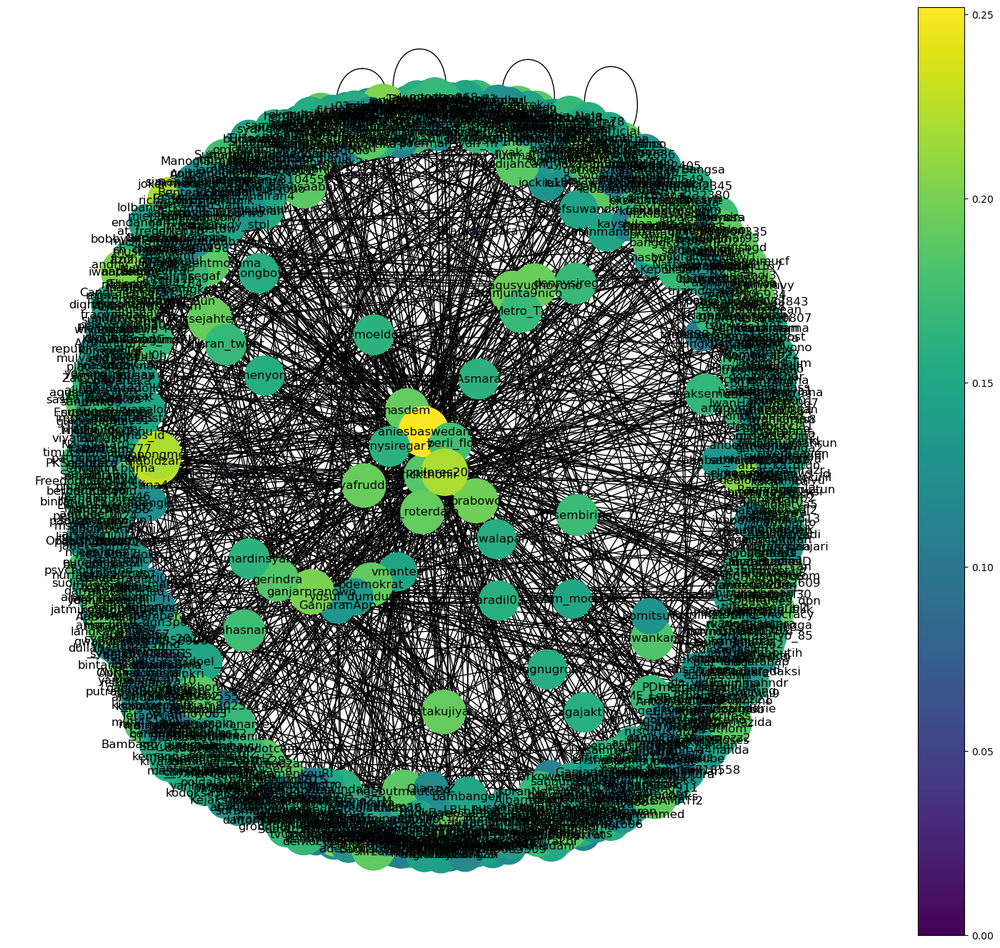

In [10]:
plt.figure(figsize=(15,13)) #mengatur ukuran gambar

clos_centrality = nx.closeness_centrality(G)
cent = np.fromiter(clos_centrality.values(), float)
sizes = cent / np.max(cent) * 200
normalize = mcolors.Normalize(vmin=cent.min(), vmax=cent.max())
colormap = cm.viridis

scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(cent)

pos = nx.spring_layout(G,k=1, scale=3)
nx.draw(G, pos, node_color=cent,
       node_size=[v * 10000 for v in dict(nx.closeness_centrality(G)).values()])
nx.draw_networkx_labels(G, pos)
plt.colorbar(scalarmappaple)
plt.savefig("closeness.png")
plt.show()

In [11]:
nx.closeness_centrality(G)
lst = nx.closeness_centrality(G).items()
dc = pd.DataFrame(lst, columns=['username', 'Nilai'])
dc.nlargest(10, 'Nilai')

,username,Nilai
29,aniesbaswedan,0.251972
735,heraloebss,0.231001
602,alabidzar2,0.229161
699,teropongmetro,0.220475
609,ppilpres2024,0.220120
518,richardwps,0.218536
278,medcom_id,0.216975
213,ganjarprabowo24,0.209574
74,inilahdotcom,0.205710
482,elmasyakur,0.205478


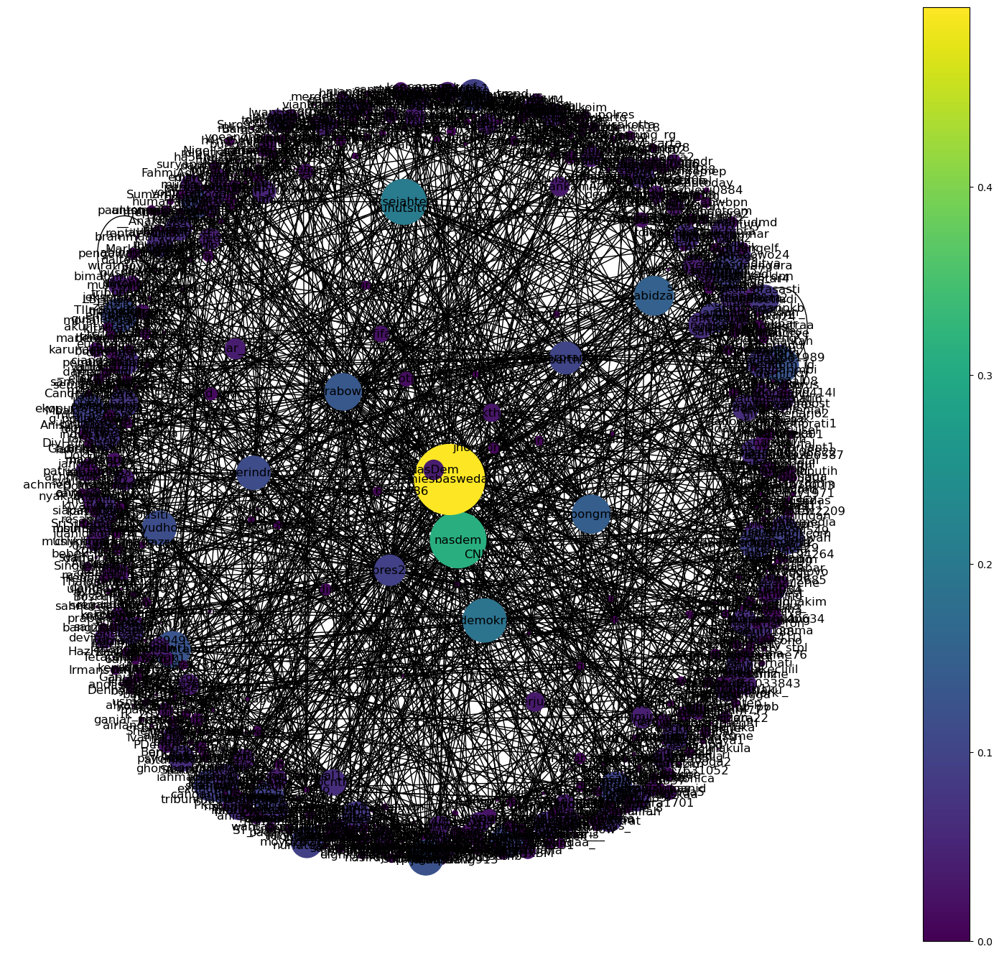

In [12]:
plt.figure(figsize=(15,13)) #mengatur ukuran gambar

eig_centrality = nx.eigenvector_centrality(G)
cent = np.fromiter(eig_centrality.values(), float)
sizes = cent / np.max(cent) * 200
normalize = mcolors.Normalize(vmin=cent.min(), vmax=cent.max())
colormap = cm.viridis

scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(cent)

pos = nx.spring_layout(G,k=1, scale=3)
nx.draw(G, pos, node_color=cent,
       node_size=[v * 10000 for v in dict(nx.eigenvector_centrality(G, max_iter = 500)).values()])
nx.draw_networkx_labels(G, pos)
plt.colorbar(scalarmappaple)
plt.savefig("eigenvector.png")
plt.show()

In [13]:
nx.eigenvector_centrality(G, max_iter = 500)
lst = nx.eigenvector_centrality(G, max_iter = 500).items()
dc = pd.DataFrame(lst, columns=['username', 'Nilai'])
dc.nlargest(10, 'Nilai')

,username,Nilai
29,aniesbaswedan,0.495514
28,nasdem,0.311917
130,pksejahtera,0.203366
98,pdemokrat,0.188097
602,alabidzar2,0.152131
699,teropongmetro,0.146012
90,prabowo,0.134906
278,medcom_id,0.129379
2,simanjunta9nico,0.128914
518,richardwps,0.123042


In [29]:
 nx.info(G)

C:\Users\Windows 10\AppData\Local\Temp\ipykernel_6296\2229780404.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  nx.info(G)


'Graph with 1038 nodes and 1246 edges'

In [14]:
nodes=len(G.nodes())
edges=len(G.edges())
print("jumlah nodes:", nodes, "\njumlah edges :", edges)

jumlah nodes: 1038 
jumlah edges : 1246
